In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import pickle
import glob

from moviepy.editor import VideoFileClip
from IPython.display import HTML

from lane_finder import LaneFinder

%matplotlib inline

In [2]:
def calibrate(debug=False): #=>mtx - transf matrix, dst - dist coef
    """
    Calibrate for camera based on chessboard images in './camera_cal' folder
    This function will also save calibration results (mtx, dst) to the 'dist_pickle.p' file.
    
    
    :param debug: enable debug output
    :returns: tuple of (mtx, dist). Transformation matrix and distortion coefitients.
    """
    nx = 9
    ny = 6
    calib_imgs = glob.glob('./camera_cal/calibration*.jpg')
    
    objp = np.zeros((nx*ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    
    img_points=[]
    obj_points=[]
    
    # find and record chessboard corners
    for img_path in calib_imgs:
        img = mpimg.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        
        if ret:
            obj_points.append(objp)
            img_points.append(corners)
            if debug:
                cv2.drawChessboardCorners(gray, (nx, ny), corners, ret)
                f, (pl1, pl2) = plt.subplots(1,2, figsize=(24,9))
                f.tight_layout()
                pl1.set_title(img_path)
                pl1.imshow(img)
                pl2.imshow(gray, cmap='gray')
                plt.show()
        elif debug:
            print('Corners not found for ', img_path)
    
    
    # get camera calibration parameters based on detected artifacts
    ret, mtx, dst, rvec, tvec = cv2.calibrateCamera(obj_points, img_points, gray.shape[::-1], None, None)
    print('Dist coefs: ', dst)
    
    #save calibration information to file
    dist_pickle = {}
    dist_pickle['mtx'] = mtx
    dist_pickle['dst'] = dst
    pickle.dump(dist_pickle, open( "dist_pickle.p", "wb" ))
    
    return mtx, dst

#calibrate(debug=True)

In [2]:
# Loading calibration data from file
# It can be regenerated by calling calibrate() function

with  open( "./dist_pickle.p", "rb" ) as f:    
    dist_pickle = pickle.load(f)
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dst"]
    
print(dist)

[[ -2.35510339e-01  -7.90388401e-02  -1.28492203e-03   8.25970403e-05
    7.22743173e-02]]


In [2]:
# test undistortion with 1 chessboard and test images

dist_valid_imgs = ['./camera_cal/calibration1.jpg', './camera_cal/calibration4.jpg', './camera_cal/calibration5.jpg']
def plot_undistortions(img_arr):
    for path in img_arr:

        test_img = mpimg.imread(path)

        undist = cv2.undistort(test_img, mtx, dist, None, None)

        f, (pl1, pl2) = plt.subplots(1,2, figsize=(12,4))
        f.tight_layout()
        pl1.set_title('Undistortion process '+ path)
        pl1.imshow(test_img)
        pl2.imshow(undist)
        plt.show()
plot_undistortions(dist_valid_imgs)

NameError: name 'mtx' is not defined

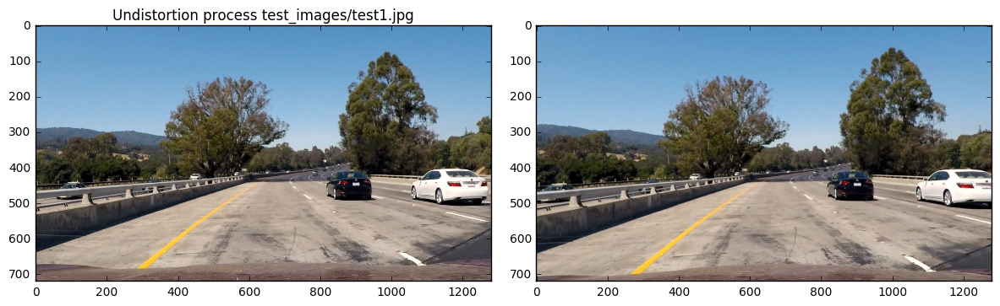

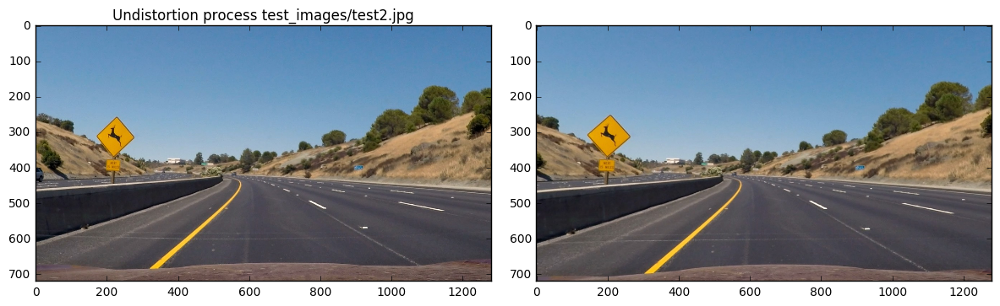

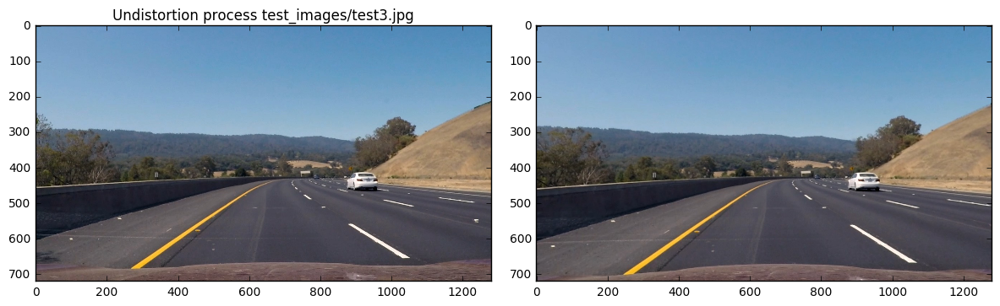

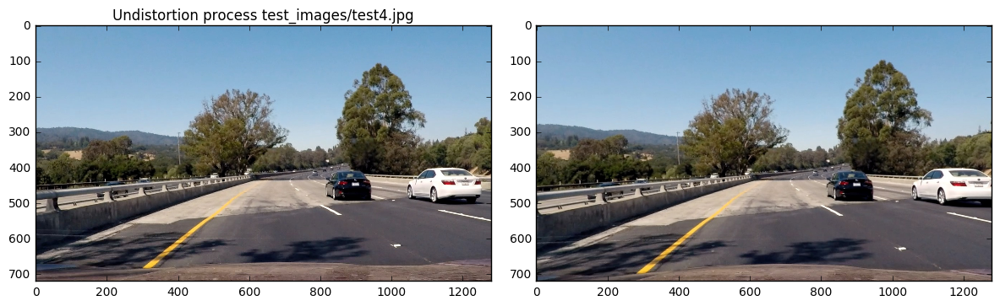

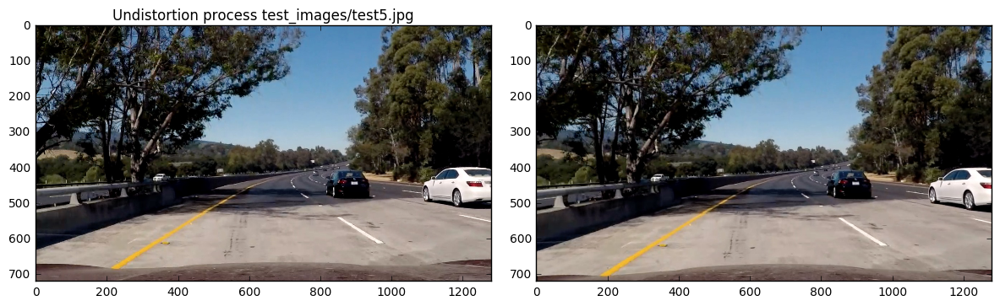

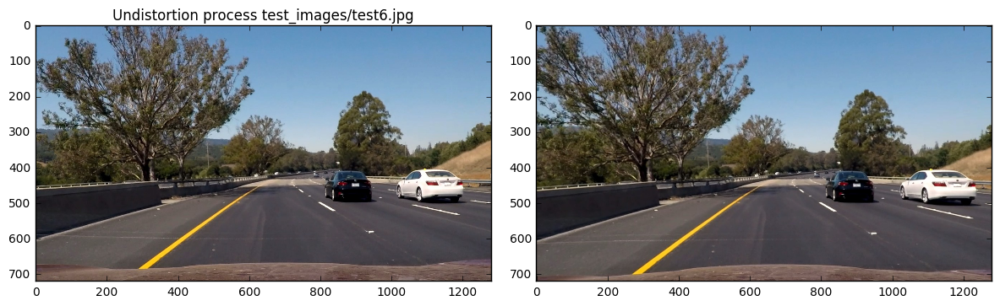

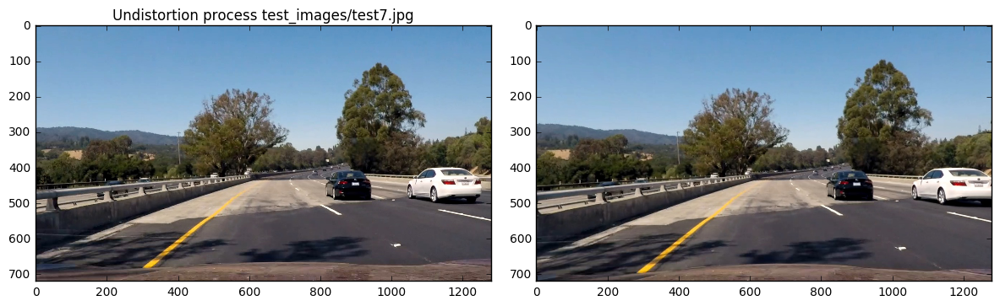

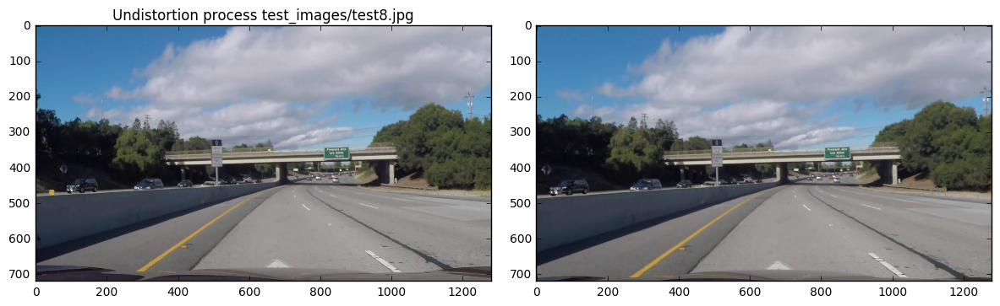

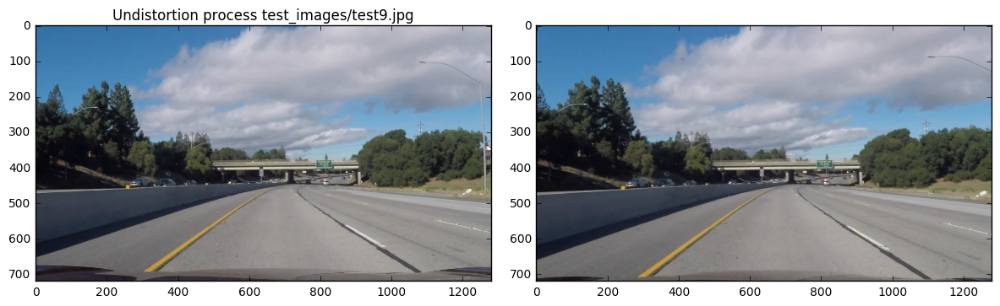

In [6]:
# For Test purposes display undistorted images from test folder

test_imgs = glob.glob('test_images/test*.jpg')
plot_undistortions(test_imgs)

### Image transformation 
Now lets transform our images from pipleline to a top-down view.

In [5]:

    

def plot_image_pair(im1, title1, im2, title2='', cmap2='hsv'):
    """
    Plot pair of images side by side.
    :param im1: left image array
    :param title1: title for left image
    :param im2: right image
    :param title2: right title
    """
    f, (pl1, pl2) = plt.subplots(1,2, figsize=(12,4))
    f.tight_layout()
    pl1.set_title(title1)
    pl1.imshow(im1)
    pl2.imshow(im2, cmap=cmap2)
    pl2.set_title(title2)
    plt.show()

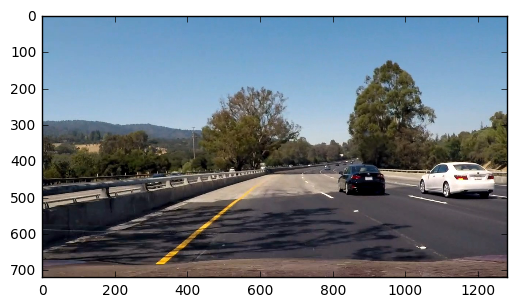

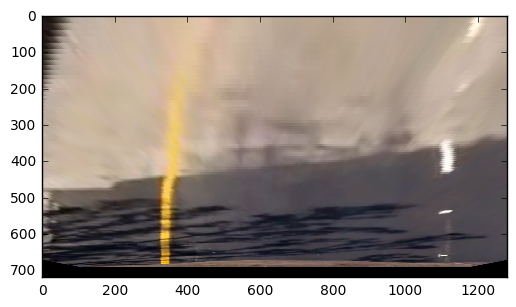

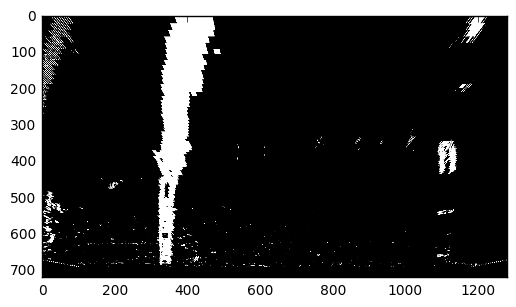

Starting lane search from left=351, right=1094
Win height: 72, n_windows=10
left_center_x=351
win_y=720, left_center_x=350, right_center_x=1094
win_y=648, left_center_x=340, right_center_x=1094
win_y=576, left_center_x=341, right_center_x=1094
win_y=504, left_center_x=347, right_center_x=1094
win_y=432, left_center_x=356, right_center_x=1112
win_y=360, left_center_x=366, right_center_x=1096
win_y=288, left_center_x=366, right_center_x=1096
win_y=216, left_center_x=384, right_center_x=1096
win_y=144, left_center_x=396, right_center_x=1096
win_y=72, left_center_x=411, right_center_x=1181


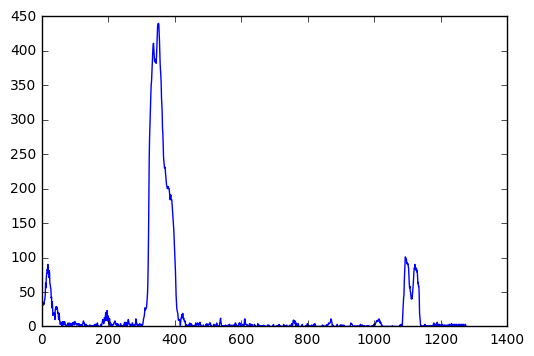

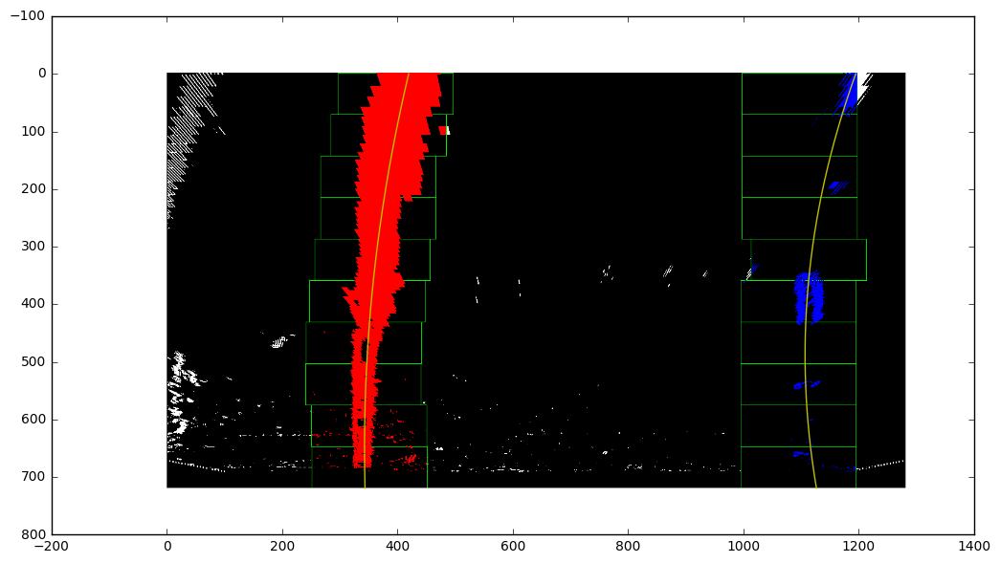

Displacement; left_lane_pos=344.0361285354928, right_lane_pos=1126.7419649671403, lane_center=735.3890467513165, car_center=640.0
Radius l=975.0, r=480.9, lane_center=735.4, car_delta=-0.47m


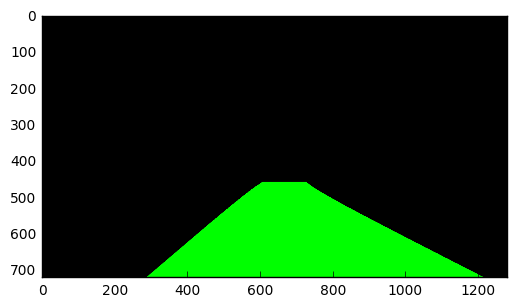

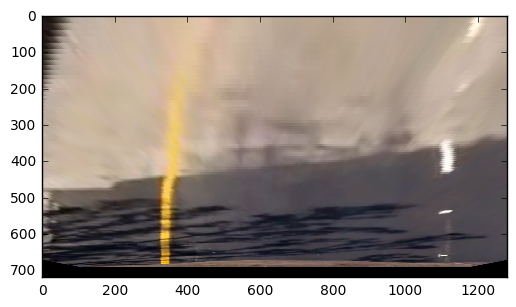

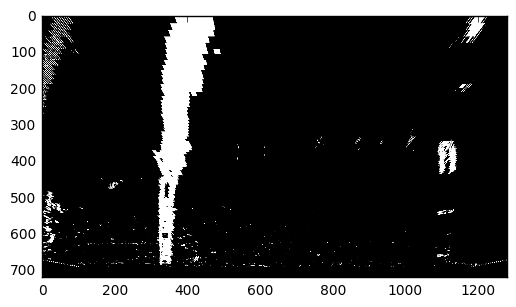

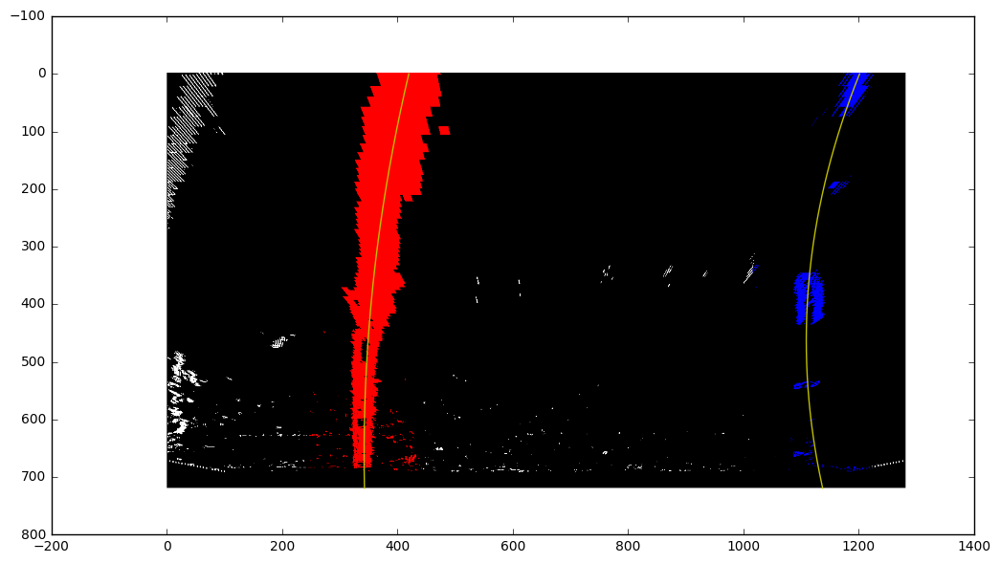

Displacement; left_lane_pos=343.02422536243193, right_lane_pos=1137.5414293618423, lane_center=740.2828273621371, car_center=640.0
Radius l=994.7, r=411.2, lane_center=740.3, car_delta=-0.49m


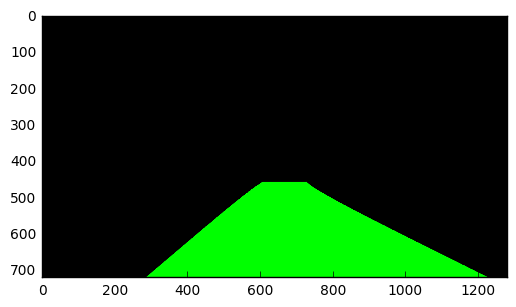

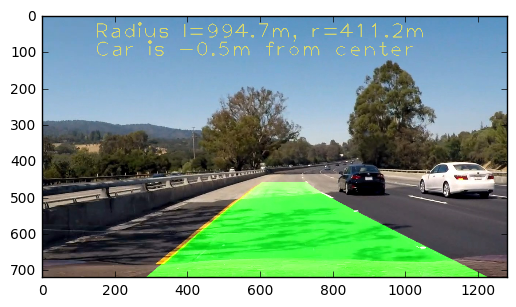

In [3]:
# Just run processing test in Debug mode for one image
ln_finder = LaneFinder(mtx, dist)
tst_img = mpimg.imread('./test_images/test4_0.jpg')
plt.imshow(tst_img)
plt.show()
#comb = undistort_transform(tst_img, mtx, dist, M)
comb = ln_finder.process_image(tst_img, debug=True)

tst_img2 = mpimg.imread('./test_images/test4.jpg')
comb = ln_finder.process_image(tst_img, debug=True)

# src_pt1 = np.array([(704, 460), (580, 460), (273, 672), (1032, 672)], np.int_)
# cv2.polylines(tst_img, [src_pt1], True, (255, 0, 0))
# mpimg.imsave('./output_images/rect-s2-50.jpg', comb)

# M = getTransformationMatrix(top_y=50)
# comb2 = undistort_transform(tst_img, mtx, dist, M)
# plot_image_pair(comb, '150', comb2, '50')
# mpimg.imsave('./output_images/rect-y50.jpg', comb2)

# M0 = getTransformationMatrix(top_y=0)
# comb0 = undistort_transform(tst_img, mtx, dist, M0)
# M250 = getTransformationMatrix(top_y=250)
# comb250 = undistort_transform(tst_img, mtx, dist, M250)
# plot_image_pair(comb0, '0', comb250, '250')
# mpimg.imsave('./output_images/rect-y0.jpg', comb0)
# mpimg.imsave('./output_images/rect-y250.jpg', comb250)




plt.imshow(comb)
plt.show()
# findLaneLines(comb, True)

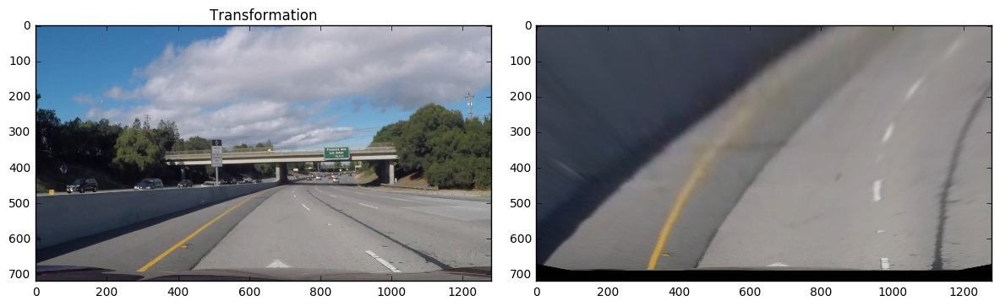

In [10]:
# test for transformation to show some output
tst_img = mpimg.imread('./test_images/test8.jpg')
comb = ln_finder.undistort_transform(tst_img)
plot_image_pair(tst_img, 'Transformation', comb)

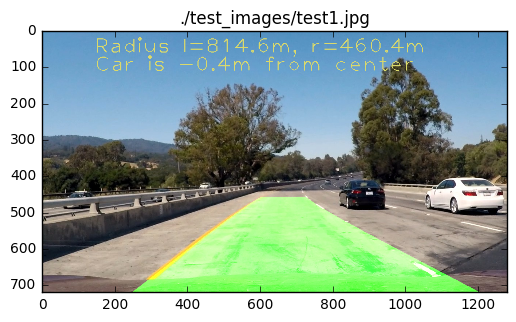

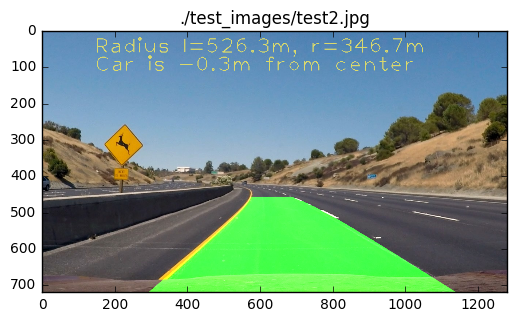

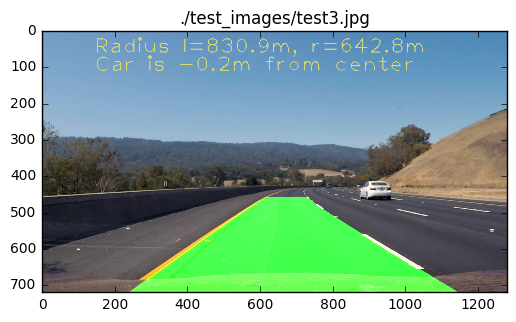

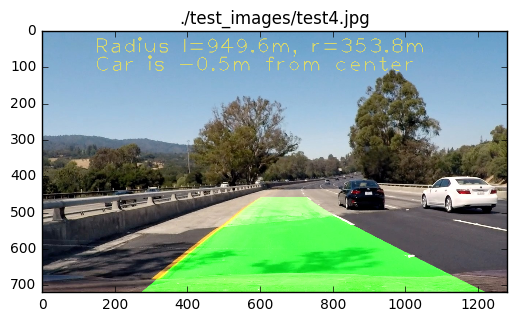

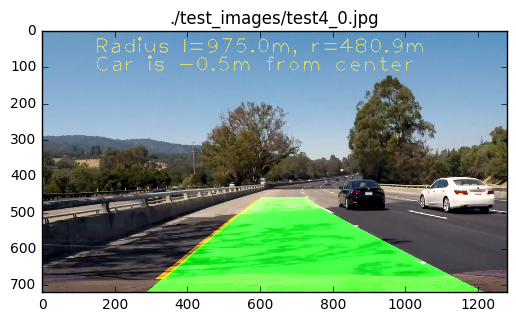

...

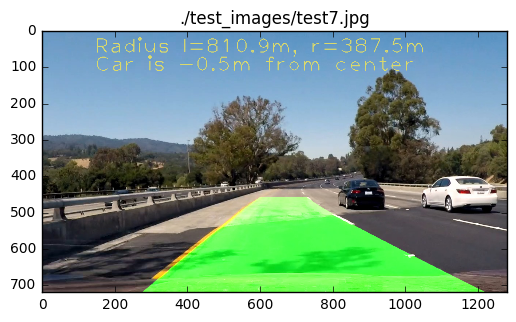

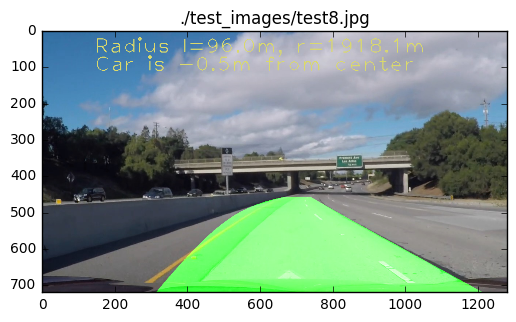

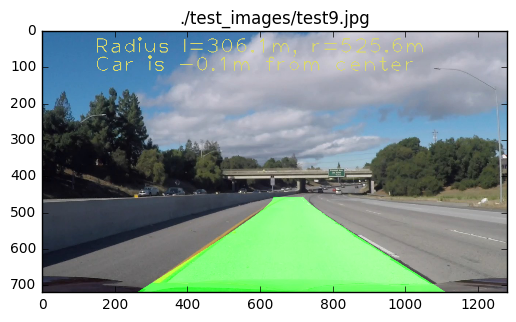

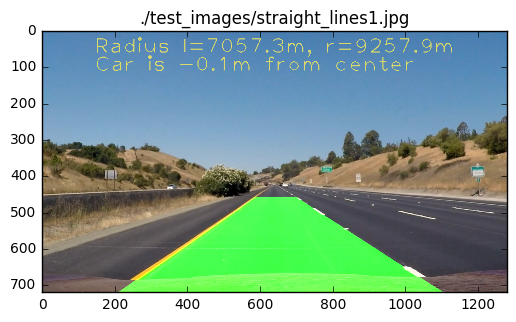

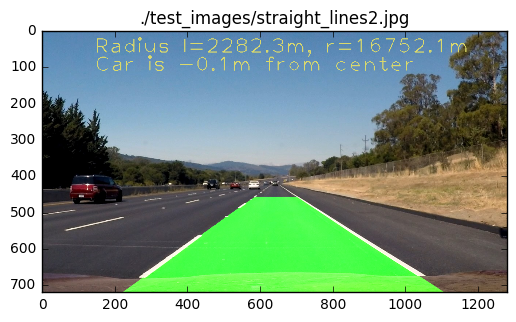

In [4]:
# Display set of processed images from test folder

paths = glob.glob('./test_images/test*.jpg')
paths.append('./test_images/straight_lines1.jpg')
paths.append('./test_images/straight_lines2.jpg')



for path in paths:
    im = mpimg.imread(path)
    
    plt.title(path)
    plt.imshow(ln_finder.process_image(im))
    plt.show()
    ln_finder.reset()

In [4]:
# Execute processing with video file and save it to output folder

ln_finder = LaneFinder(mtx, dist)
vid_output = './output_images/vid_challenge_smooth_out.mp4'
clip1 = VideoFileClip("./challenge_video.mp4", audio=False)#.cutout(0, 37)
clip = clip1.fl_image(ln_finder.process_image) 

%time clip.write_videofile(vid_output, audio=False)

[MoviePy] >>>> Building video ./output_images/vid_challenge_smooth_out.mp4


[MoviePy] Writing video ./output_images/vid_challenge_smooth_out.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 1/485 [00:00<01:53,  4.27it/s]

  0%|          | 2/485 [00:00<02:44,  2.93it/s]

  1%|          | 3/485 [00:01<02:39,  3.03it/s]

  1%|          | 4/485 [00:01<02:36,  3.07it/s]

  1%|          | 5/485 [00:01<02:33,  3.13it/s]

  1%|          | 6/485 [00:02<02:27,  3.24it/s]

  1%|▏         | 7/485 [00:02<02:26,  3.27it/s]

  2%|▏         | 8/485 [00:02<02:22,  3.35it/s]

  2%|▏         | 9/485 [00:02<02:29,  3.19it/s]

  2%|▏         | 10/485 [00:03<02:15,  3.50it/s]

  2%|▏         | 11/485 [00:03<02:06,  3.74it/s]

  2%|▏         | 12/485 [00:03<01:57,  4.03it/s]

  3%|▎         | 13/485 [00:03<01:54,  4.14it/s]

  3%|▎         | 14/485 [00:04<01:48,  4.33it/s]

  3%|▎         | 15/485 [00:04<01:50,  4.26it/s]

  3%|▎         | 16/485 [00:04<01:46,  4.40it/s]

  4%|▎         | 17/485 [00:04<01:45,  4.45it/s]

  4%|▎         | 18/485 [00:04<01:41,  4.58it/s]

  4%|▍         | 19/485 [00:05<01:42,  4.53it/s]

  4%|▍         | 20/485 [00:05<01:40,  4.64it/s]

  4%|▍         | 21/485 [00:05<01:40,  4.60it/s]

  5%|▍         | 22/485 [00:05<01:39,  4.65it/s]

  5%|▍         | 23/485 [00:06<01:41,  4.56it/s]

  5%|▍         | 24/485 [00:06<01:39,  4.65it/s]

  5%|▌         | 25/485 [00:06<01:40,  4.58it/s]

  5%|▌         | 26/485 [00:06<01:39,  4.59it/s]

  6%|▌         | 27/485 [00:06<01:41,  4.53it/s]

  6%|▌         | 28/485 [00:07<01:38,  4.62it/s]

  6%|▌         | 29/485 [00:07<01:39,  4.59it/s]

  6%|▌         | 30/485 [00:07<01:39,  4.58it/s]

  6%|▋         | 31/485 [00:07<01:40,  4.53it/s]

  7%|▋         | 32/485 [00:07<01:38,  4.60it/s]

  7%|▋         | 33/485 [00:08<01:39,  4.56it/s]

  7%|▋         | 34/485 [00:08<01:36,  4.65it/s]

  7%|▋         | 35/485 [00:08<01:38,  4.57it/s]

  7%|▋         | 36/485 [00:08<01:36,  4.65it/s]

  8%|▊         | 37/485 [00:09<01:38,  4.57it/s]

  8%|▊         | 38/485 [00:09<01:38,  4.56it/s]

  8%|▊         | 39/485 [00:09<01:50,  4.02it/s]

  8%|▊         | 40/485 [00:09<01:46,  4.18it/s]

  8%|▊         | 41/485 [00:10<01:47,  4.11it/s]

  9%|▊         | 42/485 [00:10<01:45,  4.20it/s]

  9%|▉         | 43/485 [00:10<02:03,  3.56it/s]

  9%|▉         | 44/485 [00:11<02:27,  2.98it/s]

  9%|▉         | 45/485 [00:11<02:20,  3.14it/s]

  9%|▉         | 46/485 [00:11<02:11,  3.35it/s]

 10%|▉         | 47/485 [00:12<02:15,  3.22it/s]

 10%|▉         | 48/485 [00:12<02:44,  2.65it/s]

 10%|█         | 49/485 [00:12<02:41,  2.70it/s]

 10%|█         | 50/485 [00:13<02:28,  2.92it/s]

 11%|█         | 51/485 [00:13<02:16,  3.19it/s]

 11%|█         | 52/485 [00:13<02:05,  3.45it/s]

 11%|█         | 53/485 [00:13<02:00,  3.59it/s]

 11%|█         | 54/485 [00:14<01:53,  3.79it/s]

 11%|█▏        | 55/485 [00:14<01:50,  3.88it/s]

 12%|█▏        | 56/485 [00:14<01:45,  4.08it/s]

 12%|█▏        | 57/485 [00:14<01:43,  4.12it/s]

 12%|█▏        | 58/485 [00:15<01:39,  4.30it/s]

 12%|█▏        | 59/485 [00:15<01:39,  4.28it/s]

 12%|█▏        | 60/485 [00:15<01:37,  4.37it/s]

 13%|█▎        | 61/485 [00:15<01:36,  4.38it/s]

 13%|█▎        | 62/485 [00:15<01:34,  4.49it/s]

 13%|█▎        | 63/485 [00:16<01:38,  4.29it/s]

 13%|█▎        | 64/485 [00:16<01:38,  4.28it/s]

 13%|█▎        | 65/485 [00:16<01:38,  4.28it/s]

 14%|█▎        | 66/485 [00:16<01:34,  4.42it/s]

 14%|█▍        | 67/485 [00:17<01:37,  4.30it/s]

 14%|█▍        | 68/485 [00:17<01:33,  4.45it/s]

 14%|█▍        | 69/485 [00:17<01:35,  4.38it/s]

 14%|█▍        | 70/485 [00:17<01:32,  4.49it/s]

 15%|█▍        | 71/485 [00:17<01:32,  4.46it/s]

 15%|█▍        | 72/485 [00:18<01:30,  4.57it/s]

 15%|█▌        | 73/485 [00:18<01:31,  4.52it/s]

 15%|█▌        | 74/485 [00:18<01:30,  4.54it/s]

 15%|█▌        | 75/485 [00:18<01:34,  4.34it/s]

 16%|█▌        | 76/485 [00:19<01:31,  4.46it/s]

 16%|█▌        | 77/485 [00:19<01:30,  4.49it/s]

 16%|█▌        | 78/485 [00:19<01:30,  4.51it/s]

 16%|█▋        | 79/485 [00:19<01:29,  4.54it/s]

 16%|█▋        | 80/485 [00:19<01:28,  4.60it/s]

 17%|█▋        | 81/485 [00:20<01:29,  4.50it/s]

 17%|█▋        | 82/485 [00:20<01:34,  4.28it/s]

 17%|█▋        | 83/485 [00:20<01:35,  4.23it/s]

 17%|█▋        | 84/485 [00:20<01:32,  4.33it/s]

 18%|█▊        | 85/485 [00:21<01:32,  4.32it/s]

 18%|█▊        | 86/485 [00:21<01:29,  4.44it/s]

 18%|█▊        | 87/485 [00:21<01:31,  4.36it/s]

 18%|█▊        | 88/485 [00:21<01:28,  4.49it/s]

 18%|█▊        | 89/485 [00:22<01:29,  4.43it/s]

 19%|█▊        | 90/485 [00:22<01:28,  4.46it/s]

 19%|█▉        | 91/485 [00:22<01:29,  4.43it/s]

 19%|█▉        | 92/485 [00:22<01:26,  4.53it/s]

 19%|█▉        | 93/485 [00:22<01:27,  4.47it/s]

 19%|█▉        | 94/485 [00:23<01:25,  4.56it/s]

 20%|█▉        | 95/485 [00:23<01:26,  4.52it/s]

 20%|█▉        | 96/485 [00:23<01:25,  4.57it/s]

 20%|██        | 97/485 [00:23<01:26,  4.51it/s]

 20%|██        | 98/485 [00:24<01:25,  4.53it/s]

 20%|██        | 99/485 [00:24<01:26,  4.44it/s]

 21%|██        | 100/485 [00:24<01:32,  4.17it/s]

 21%|██        | 101/485 [00:24<01:30,  4.25it/s]

 21%|██        | 102/485 [00:24<01:27,  4.39it/s]

 21%|██        | 103/485 [00:25<01:26,  4.39it/s]

 21%|██▏       | 104/485 [00:25<01:23,  4.55it/s]

 22%|██▏       | 105/485 [00:25<01:24,  4.49it/s]

 22%|██▏       | 106/485 [00:25<01:23,  4.53it/s]

 22%|██▏       | 107/485 [00:26<01:25,  4.44it/s]

 22%|██▏       | 108/485 [00:26<01:23,  4.53it/s]

 22%|██▏       | 109/485 [00:26<01:25,  4.37it/s]

 23%|██▎       | 110/485 [00:26<01:23,  4.47it/s]

 23%|██▎       | 111/485 [00:26<01:23,  4.46it/s]

 23%|██▎       | 112/485 [00:27<01:22,  4.51it/s]

 23%|██▎       | 113/485 [00:27<01:22,  4.50it/s]

 24%|██▎       | 114/485 [00:27<01:22,  4.49it/s]

 24%|██▎       | 115/485 [00:27<01:22,  4.48it/s]

 24%|██▍       | 116/485 [00:28<01:21,  4.52it/s]

 24%|██▍       | 117/485 [00:28<01:21,  4.51it/s]

 24%|██▍       | 118/485 [00:28<01:20,  4.56it/s]

 25%|██▍       | 119/485 [00:28<01:25,  4.26it/s]

 25%|██▍       | 120/485 [00:29<01:29,  4.07it/s]

 25%|██▍       | 121/485 [00:29<01:27,  4.15it/s]

 25%|██▌       | 122/485 [00:29<01:25,  4.24it/s]

 25%|██▌       | 123/485 [00:29<01:31,  3.98it/s]

 26%|██▌       | 124/485 [00:30<01:27,  4.12it/s]

 26%|██▌       | 125/485 [00:30<01:26,  4.16it/s]

 26%|██▌       | 126/485 [00:30<01:23,  4.28it/s]

 26%|██▌       | 127/485 [00:30<01:24,  4.22it/s]

 26%|██▋       | 128/485 [00:30<01:21,  4.38it/s]

 27%|██▋       | 129/485 [00:31<01:30,  3.94it/s]

 27%|██▋       | 130/485 [00:31<01:53,  3.14it/s]

 27%|██▋       | 131/485 [00:32<02:17,  2.57it/s]

 27%|██▋       | 132/485 [00:32<02:00,  2.92it/s]

 27%|██▋       | 133/485 [00:33<02:37,  2.23it/s]

 28%|██▊       | 134/485 [00:33<02:25,  2.41it/s]

 28%|██▊       | 135/485 [00:33<02:27,  2.37it/s]

 28%|██▊       | 136/485 [00:34<02:28,  2.35it/s]

 28%|██▊       | 137/485 [00:34<02:37,  2.21it/s]

 28%|██▊       | 138/485 [00:35<02:11,  2.64it/s]

 29%|██▊       | 139/485 [00:35<01:54,  3.03it/s]

 29%|██▉       | 140/485 [00:35<01:40,  3.43it/s]

 29%|██▉       | 141/485 [00:35<01:32,  3.73it/s]

 29%|██▉       | 142/485 [00:35<01:25,  3.99it/s]

 29%|██▉       | 143/485 [00:36<01:23,  4.08it/s]

 30%|██▉       | 144/485 [00:36<01:18,  4.33it/s]

 30%|██▉       | 145/485 [00:36<01:17,  4.38it/s]

 30%|███       | 146/485 [00:36<01:27,  3.86it/s]

 30%|███       | 147/485 [00:37<01:48,  3.10it/s]

 31%|███       | 148/485 [00:37<01:53,  2.98it/s]

 31%|███       | 149/485 [00:38<02:10,  2.57it/s]

 31%|███       | 150/485 [00:38<02:17,  2.44it/s]

 31%|███       | 151/485 [00:39<02:11,  2.53it/s]

 31%|███▏      | 152/485 [00:39<02:08,  2.60it/s]

 32%|███▏      | 153/485 [00:40<02:23,  2.32it/s]

 32%|███▏      | 154/485 [00:40<02:56,  1.88it/s]

 32%|███▏      | 155/485 [00:41<03:26,  1.60it/s]

 32%|███▏      | 156/485 [00:42<03:09,  1.74it/s]

 32%|███▏      | 157/485 [00:42<03:28,  1.57it/s]

 33%|███▎      | 158/485 [00:43<03:56,  1.38it/s]

 33%|███▎      | 159/485 [00:44<03:22,  1.61it/s]

 33%|███▎      | 160/485 [00:44<02:56,  1.84it/s]

 33%|███▎      | 161/485 [00:44<02:42,  2.00it/s]

 33%|███▎      | 162/485 [00:45<02:23,  2.25it/s]

 34%|███▎      | 163/485 [00:45<02:30,  2.14it/s]

 34%|███▍      | 164/485 [00:46<02:33,  2.09it/s]

 34%|███▍      | 165/485 [00:46<02:10,  2.45it/s]

 34%|███▍      | 166/485 [00:46<01:52,  2.83it/s]

 34%|███▍      | 167/485 [00:46<01:41,  3.13it/s]

 35%|███▍      | 168/485 [00:47<01:31,  3.45it/s]

 35%|███▍      | 169/485 [00:47<01:27,  3.63it/s]

 35%|███▌      | 170/485 [00:47<01:21,  3.85it/s]

 35%|███▌      | 171/485 [00:47<01:20,  3.92it/s]

 35%|███▌      | 172/485 [00:48<01:16,  4.10it/s]

 36%|███▌      | 173/485 [00:48<01:15,  4.14it/s]

 36%|███▌      | 174/485 [00:48<01:14,  4.15it/s]

 36%|███▌      | 175/485 [00:48<01:14,  4.14it/s]

 36%|███▋      | 176/485 [00:49<01:13,  4.19it/s]

 36%|███▋      | 177/485 [00:49<01:13,  4.18it/s]

 37%|███▋      | 178/485 [00:49<01:11,  4.29it/s]

 37%|███▋      | 179/485 [00:49<01:12,  4.24it/s]

 37%|███▋      | 180/485 [00:50<01:11,  4.29it/s]

 37%|███▋      | 181/485 [00:50<01:12,  4.19it/s]

 38%|███▊      | 182/485 [00:50<01:12,  4.20it/s]

 38%|███▊      | 183/485 [00:50<01:11,  4.20it/s]

 38%|███▊      | 184/485 [00:51<01:13,  4.09it/s]

 38%|███▊      | 185/485 [00:51<01:47,  2.80it/s]

 38%|███▊      | 186/485 [00:51<01:45,  2.84it/s]

 39%|███▊      | 187/485 [00:52<01:47,  2.78it/s]

 39%|███▉      | 188/485 [00:52<01:38,  3.01it/s]

 39%|███▉      | 189/485 [00:52<01:29,  3.30it/s]

 39%|███▉      | 190/485 [00:53<01:21,  3.61it/s]

 39%|███▉      | 191/485 [00:53<01:17,  3.81it/s]

 40%|███▉      | 192/485 [00:53<01:12,  4.04it/s]

 40%|███▉      | 193/485 [00:53<01:11,  4.10it/s]

 40%|████      | 194/485 [00:53<01:07,  4.28it/s]

 40%|████      | 195/485 [00:54<01:07,  4.32it/s]

 40%|████      | 196/485 [00:54<01:05,  4.41it/s]

 41%|████      | 197/485 [00:54<01:05,  4.36it/s]

 41%|████      | 198/485 [00:54<01:05,  4.40it/s]

 41%|████      | 199/485 [00:55<01:10,  4.05it/s]

 41%|████      | 200/485 [00:55<01:13,  3.89it/s]

 41%|████▏     | 201/485 [00:55<01:25,  3.33it/s]

 42%|████▏     | 202/485 [00:56<01:37,  2.90it/s]

 42%|████▏     | 203/485 [00:56<01:56,  2.42it/s]

 42%|████▏     | 204/485 [00:57<01:55,  2.44it/s]

 42%|████▏     | 205/485 [00:57<01:39,  2.82it/s]

 42%|████▏     | 206/485 [00:57<01:29,  3.13it/s]

 43%|████▎     | 207/485 [00:57<01:22,  3.37it/s]

 43%|████▎     | 208/485 [00:58<01:16,  3.63it/s]

 43%|████▎     | 209/485 [00:58<01:12,  3.79it/s]

 43%|████▎     | 210/485 [00:58<01:10,  3.88it/s]

 44%|████▎     | 211/485 [00:59<01:23,  3.29it/s]

 44%|████▎     | 212/485 [00:59<01:23,  3.25it/s]

 44%|████▍     | 213/485 [00:59<01:22,  3.29it/s]

 44%|████▍     | 214/485 [01:00<01:25,  3.16it/s]

 44%|████▍     | 215/485 [01:00<01:18,  3.46it/s]

 45%|████▍     | 216/485 [01:00<01:12,  3.73it/s]

 45%|████▍     | 217/485 [01:00<01:08,  3.92it/s]

 45%|████▍     | 218/485 [01:00<01:04,  4.13it/s]

 45%|████▌     | 219/485 [01:01<01:02,  4.25it/s]

 45%|████▌     | 220/485 [01:01<01:00,  4.40it/s]

 46%|████▌     | 221/485 [01:01<01:00,  4.38it/s]

 46%|████▌     | 222/485 [01:01<00:58,  4.51it/s]

 46%|████▌     | 223/485 [01:02<00:59,  4.44it/s]

 46%|████▌     | 224/485 [01:02<00:57,  4.53it/s]

 46%|████▋     | 225/485 [01:02<00:57,  4.49it/s]

 47%|████▋     | 226/485 [01:02<00:56,  4.60it/s]

 47%|████▋     | 227/485 [01:02<00:57,  4.49it/s]

 47%|████▋     | 228/485 [01:03<00:55,  4.63it/s]

 47%|████▋     | 229/485 [01:03<00:55,  4.61it/s]

 47%|████▋     | 230/485 [01:03<00:55,  4.62it/s]

 48%|████▊     | 231/485 [01:03<00:54,  4.63it/s]

 48%|████▊     | 232/485 [01:03<00:53,  4.75it/s]

 48%|████▊     | 233/485 [01:04<00:53,  4.75it/s]

 48%|████▊     | 234/485 [01:04<00:53,  4.66it/s]

 48%|████▊     | 235/485 [01:04<00:53,  4.65it/s]

 49%|████▊     | 236/485 [01:04<00:53,  4.68it/s]

 49%|████▉     | 237/485 [01:05<00:53,  4.68it/s]

 49%|████▉     | 238/485 [01:05<00:53,  4.63it/s]

 49%|████▉     | 239/485 [01:05<00:53,  4.56it/s]

 49%|████▉     | 240/485 [01:05<00:52,  4.63it/s]

 50%|████▉     | 241/485 [01:05<00:52,  4.61it/s]

 50%|████▉     | 242/485 [01:06<00:52,  4.63it/s]

 50%|█████     | 243/485 [01:06<00:52,  4.63it/s]

 50%|█████     | 244/485 [01:06<00:56,  4.30it/s]

 51%|█████     | 245/485 [01:06<00:57,  4.15it/s]

 51%|█████     | 246/485 [01:07<00:55,  4.31it/s]

 51%|█████     | 247/485 [01:07<00:54,  4.40it/s]

 51%|█████     | 248/485 [01:07<00:52,  4.54it/s]

 51%|█████▏    | 249/485 [01:07<00:53,  4.41it/s]

 52%|█████▏    | 250/485 [01:07<00:54,  4.34it/s]

 52%|█████▏    | 251/485 [01:08<00:54,  4.32it/s]

 52%|█████▏    | 252/485 [01:08<00:52,  4.47it/s]

 52%|█████▏    | 253/485 [01:08<00:53,  4.34it/s]

 52%|█████▏    | 254/485 [01:08<00:52,  4.44it/s]

 53%|█████▎    | 255/485 [01:09<00:51,  4.51it/s]

 53%|█████▎    | 256/485 [01:09<00:49,  4.61it/s]

 53%|█████▎    | 257/485 [01:09<00:49,  4.63it/s]

 53%|█████▎    | 258/485 [01:09<00:47,  4.73it/s]

 53%|█████▎    | 259/485 [01:09<00:50,  4.49it/s]

 54%|█████▎    | 260/485 [01:10<00:53,  4.17it/s]

 54%|█████▍    | 261/485 [01:10<00:53,  4.17it/s]

 54%|█████▍    | 262/485 [01:10<00:56,  3.94it/s]

 54%|█████▍    | 263/485 [01:11<01:03,  3.51it/s]

 54%|█████▍    | 264/485 [01:11<00:59,  3.72it/s]

 55%|█████▍    | 265/485 [01:11<00:57,  3.82it/s]

 55%|█████▍    | 266/485 [01:11<00:53,  4.07it/s]

 55%|█████▌    | 267/485 [01:12<00:56,  3.84it/s]

 55%|█████▌    | 268/485 [01:12<01:10,  3.06it/s]

 55%|█████▌    | 269/485 [01:12<01:12,  2.98it/s]

 56%|█████▌    | 270/485 [01:13<01:05,  3.27it/s]

 56%|█████▌    | 271/485 [01:13<01:00,  3.53it/s]

 56%|█████▌    | 272/485 [01:13<00:57,  3.70it/s]

 56%|█████▋    | 273/485 [01:13<00:54,  3.87it/s]

 56%|█████▋    | 274/485 [01:14<00:51,  4.12it/s]

 57%|█████▋    | 275/485 [01:14<00:49,  4.24it/s]

 57%|█████▋    | 276/485 [01:14<00:47,  4.36it/s]

 57%|█████▋    | 277/485 [01:14<00:47,  4.38it/s]

 57%|█████▋    | 278/485 [01:14<00:46,  4.49it/s]

 58%|█████▊    | 279/485 [01:15<00:46,  4.46it/s]

 58%|█████▊    | 280/485 [01:15<00:45,  4.51it/s]

 58%|█████▊    | 281/485 [01:15<00:45,  4.45it/s]

 58%|█████▊    | 282/485 [01:15<00:45,  4.47it/s]

 58%|█████▊    | 283/485 [01:16<00:45,  4.40it/s]

 59%|█████▊    | 284/485 [01:16<00:45,  4.41it/s]

 59%|█████▉    | 285/485 [01:16<00:45,  4.39it/s]

 59%|█████▉    | 286/485 [01:16<00:43,  4.54it/s]

 59%|█████▉    | 287/485 [01:16<00:43,  4.58it/s]

 59%|█████▉    | 288/485 [01:17<00:42,  4.68it/s]

 60%|█████▉    | 289/485 [01:17<00:41,  4.67it/s]

 60%|█████▉    | 290/485 [01:17<00:40,  4.78it/s]

 60%|██████    | 291/485 [01:17<00:41,  4.70it/s]

 60%|██████    | 292/485 [01:17<00:40,  4.75it/s]

 60%|██████    | 293/485 [01:18<00:40,  4.74it/s]

 61%|██████    | 294/485 [01:18<00:39,  4.78it/s]

 61%|██████    | 295/485 [01:18<00:39,  4.76it/s]

 61%|██████    | 296/485 [01:18<00:39,  4.74it/s]

 61%|██████    | 297/485 [01:19<00:39,  4.74it/s]

 61%|██████▏   | 298/485 [01:19<00:38,  4.83it/s]

 62%|██████▏   | 299/485 [01:19<00:39,  4.76it/s]

 62%|██████▏   | 300/485 [01:19<00:38,  4.79it/s]

 62%|██████▏   | 301/485 [01:19<00:39,  4.70it/s]

 62%|██████▏   | 302/485 [01:20<00:38,  4.77it/s]

 62%|██████▏   | 303/485 [01:20<00:38,  4.69it/s]

 63%|██████▎   | 304/485 [01:20<00:37,  4.80it/s]

 63%|██████▎   | 305/485 [01:20<00:37,  4.78it/s]

 63%|██████▎   | 306/485 [01:20<00:37,  4.78it/s]

 63%|██████▎   | 307/485 [01:21<00:37,  4.79it/s]

 64%|██████▎   | 308/485 [01:21<00:36,  4.81it/s]

 64%|██████▎   | 309/485 [01:21<00:37,  4.71it/s]

 64%|██████▍   | 310/485 [01:21<00:36,  4.80it/s]

 64%|██████▍   | 311/485 [01:21<00:36,  4.78it/s]

 64%|██████▍   | 312/485 [01:22<00:35,  4.90it/s]

 65%|██████▍   | 313/485 [01:22<00:35,  4.78it/s]

 65%|██████▍   | 314/485 [01:22<00:35,  4.82it/s]

 65%|██████▍   | 315/485 [01:22<00:35,  4.78it/s]

 65%|██████▌   | 316/485 [01:22<00:34,  4.87it/s]

 65%|██████▌   | 317/485 [01:23<00:35,  4.77it/s]

 66%|██████▌   | 318/485 [01:23<00:34,  4.79it/s]

 66%|██████▌   | 319/485 [01:23<00:35,  4.72it/s]

 66%|██████▌   | 320/485 [01:23<00:34,  4.75it/s]

 66%|██████▌   | 321/485 [01:24<00:34,  4.75it/s]

 66%|██████▋   | 322/485 [01:24<00:34,  4.77it/s]

 67%|██████▋   | 323/485 [01:24<00:37,  4.31it/s]

 67%|██████▋   | 324/485 [01:24<00:35,  4.51it/s]

 67%|██████▋   | 325/485 [01:24<00:35,  4.52it/s]

 67%|██████▋   | 326/485 [01:25<00:34,  4.65it/s]

 67%|██████▋   | 327/485 [01:25<00:33,  4.65it/s]

 68%|██████▊   | 328/485 [01:25<00:32,  4.76it/s]

 68%|██████▊   | 329/485 [01:25<00:32,  4.77it/s]

 68%|██████▊   | 330/485 [01:25<00:32,  4.84it/s]

 68%|██████▊   | 331/485 [01:26<00:32,  4.73it/s]

 68%|██████▊   | 332/485 [01:26<00:32,  4.69it/s]

 69%|██████▊   | 333/485 [01:26<00:33,  4.47it/s]

 69%|██████▉   | 334/485 [01:26<00:33,  4.54it/s]

 69%|██████▉   | 335/485 [01:27<00:32,  4.57it/s]

 69%|██████▉   | 336/485 [01:27<00:33,  4.43it/s]

 69%|██████▉   | 337/485 [01:27<00:33,  4.48it/s]

 70%|██████▉   | 338/485 [01:27<00:32,  4.57it/s]

 70%|██████▉   | 339/485 [01:27<00:31,  4.57it/s]

 70%|███████   | 340/485 [01:28<00:30,  4.73it/s]

 70%|███████   | 341/485 [01:28<00:30,  4.67it/s]

 71%|███████   | 342/485 [01:28<00:29,  4.79it/s]

 71%|███████   | 343/485 [01:28<00:30,  4.72it/s]

 71%|███████   | 344/485 [01:29<00:29,  4.86it/s]

 71%|███████   | 345/485 [01:29<00:34,  4.12it/s]

 71%|███████▏  | 346/485 [01:29<00:44,  3.12it/s]

 72%|███████▏  | 347/485 [01:30<00:51,  2.67it/s]

 72%|███████▏  | 348/485 [01:30<00:44,  3.11it/s]

 72%|███████▏  | 349/485 [01:30<00:42,  3.17it/s]

 72%|███████▏  | 350/485 [01:31<00:45,  2.95it/s]

 72%|███████▏  | 351/485 [01:31<00:40,  3.30it/s]

 73%|███████▎  | 352/485 [01:31<00:37,  3.57it/s]

 73%|███████▎  | 353/485 [01:31<00:35,  3.74it/s]

 73%|███████▎  | 354/485 [01:32<00:33,  3.96it/s]

 73%|███████▎  | 355/485 [01:32<00:33,  3.85it/s]

 73%|███████▎  | 356/485 [01:32<00:32,  3.94it/s]

 74%|███████▎  | 357/485 [01:32<00:30,  4.17it/s]

 74%|███████▍  | 358/485 [01:33<00:28,  4.41it/s]

 74%|███████▍  | 359/485 [01:33<00:27,  4.52it/s]

 74%|███████▍  | 360/485 [01:33<00:27,  4.57it/s]

 74%|███████▍  | 361/485 [01:33<00:27,  4.53it/s]

 75%|███████▍  | 362/485 [01:33<00:27,  4.53it/s]

 75%|███████▍  | 363/485 [01:34<00:26,  4.62it/s]

 75%|███████▌  | 364/485 [01:34<00:26,  4.61it/s]

 75%|███████▌  | 365/485 [01:34<00:26,  4.61it/s]

 75%|███████▌  | 366/485 [01:34<00:25,  4.76it/s]

 76%|███████▌  | 367/485 [01:34<00:24,  4.75it/s]

 76%|███████▌  | 368/485 [01:35<00:24,  4.75it/s]

 76%|███████▌  | 369/485 [01:35<00:26,  4.45it/s]

 76%|███████▋  | 370/485 [01:35<00:28,  4.01it/s]

 76%|███████▋  | 371/485 [01:36<00:28,  3.95it/s]

 77%|███████▋  | 372/485 [01:36<00:26,  4.26it/s]

 77%|███████▋  | 373/485 [01:36<00:25,  4.33it/s]

 77%|███████▋  | 374/485 [01:36<00:24,  4.54it/s]

 77%|███████▋  | 375/485 [01:36<00:23,  4.61it/s]

 78%|███████▊  | 376/485 [01:37<00:23,  4.66it/s]

 78%|███████▊  | 377/485 [01:37<00:22,  4.71it/s]

 78%|███████▊  | 378/485 [01:37<00:22,  4.81it/s]

 78%|███████▊  | 379/485 [01:37<00:22,  4.76it/s]

 78%|███████▊  | 380/485 [01:37<00:21,  4.78it/s]

 79%|███████▊  | 381/485 [01:38<00:22,  4.64it/s]

 79%|███████▉  | 382/485 [01:38<00:21,  4.77it/s]

 79%|███████▉  | 383/485 [01:38<00:21,  4.73it/s]

 79%|███████▉  | 384/485 [01:38<00:20,  4.82it/s]

 79%|███████▉  | 385/485 [01:38<00:21,  4.75it/s]

 80%|███████▉  | 386/485 [01:39<00:20,  4.83it/s]

 80%|███████▉  | 387/485 [01:39<00:20,  4.79it/s]

 80%|████████  | 388/485 [01:39<00:22,  4.35it/s]

 80%|████████  | 389/485 [01:39<00:22,  4.20it/s]

 80%|████████  | 390/485 [01:40<00:21,  4.35it/s]

 81%|████████  | 391/485 [01:40<00:22,  4.09it/s]

 81%|████████  | 392/485 [01:40<00:24,  3.86it/s]

 81%|████████  | 393/485 [01:40<00:24,  3.83it/s]

 81%|████████  | 394/485 [01:41<00:26,  3.43it/s]

 81%|████████▏ | 395/485 [01:41<00:25,  3.50it/s]

 82%|████████▏ | 396/485 [01:41<00:23,  3.73it/s]

 82%|████████▏ | 397/485 [01:42<00:24,  3.63it/s]

 82%|████████▏ | 398/485 [01:42<00:39,  2.20it/s]

 82%|████████▏ | 399/485 [01:43<00:44,  1.95it/s]

 82%|████████▏ | 400/485 [01:44<00:44,  1.90it/s]

 83%|████████▎ | 401/485 [01:44<00:38,  2.16it/s]

 83%|████████▎ | 402/485 [01:44<00:33,  2.48it/s]

 83%|████████▎ | 403/485 [01:44<00:29,  2.76it/s]

 83%|████████▎ | 404/485 [01:45<00:31,  2.58it/s]

 84%|████████▎ | 405/485 [01:45<00:34,  2.30it/s]

 84%|████████▎ | 406/485 [01:46<00:32,  2.46it/s]

 84%|████████▍ | 407/485 [01:46<00:31,  2.49it/s]

 84%|████████▍ | 408/485 [01:47<00:33,  2.32it/s]

 84%|████████▍ | 409/485 [01:47<00:36,  2.09it/s]

 85%|████████▍ | 410/485 [01:48<00:39,  1.88it/s]

 85%|████████▍ | 411/485 [01:48<00:38,  1.93it/s]

 85%|████████▍ | 412/485 [01:49<00:33,  2.18it/s]

 85%|████████▌ | 413/485 [01:49<00:28,  2.52it/s]

 85%|████████▌ | 414/485 [01:49<00:25,  2.78it/s]

 86%|████████▌ | 415/485 [01:50<00:23,  2.96it/s]

 86%|████████▌ | 416/485 [01:50<00:21,  3.26it/s]

 86%|████████▌ | 417/485 [01:50<00:18,  3.58it/s]

 86%|████████▌ | 418/485 [01:50<00:21,  3.14it/s]

 86%|████████▋ | 419/485 [01:51<00:19,  3.43it/s]

 87%|████████▋ | 420/485 [01:51<00:17,  3.66it/s]

 87%|████████▋ | 421/485 [01:51<00:16,  3.92it/s]

 87%|████████▋ | 422/485 [01:51<00:15,  4.00it/s]

 87%|████████▋ | 423/485 [01:52<00:14,  4.24it/s]

 87%|████████▋ | 424/485 [01:52<00:14,  4.28it/s]

 88%|████████▊ | 425/485 [01:52<00:13,  4.37it/s]

 88%|████████▊ | 426/485 [01:52<00:13,  4.40it/s]

 88%|████████▊ | 427/485 [01:52<00:13,  4.45it/s]

 88%|████████▊ | 428/485 [01:53<00:12,  4.49it/s]

 88%|████████▊ | 429/485 [01:53<00:12,  4.57it/s]

 89%|████████▊ | 430/485 [01:53<00:12,  4.53it/s]

 89%|████████▉ | 431/485 [01:53<00:11,  4.61it/s]

 89%|████████▉ | 432/485 [01:54<00:11,  4.58it/s]

 89%|████████▉ | 433/485 [01:54<00:11,  4.51it/s]

 89%|████████▉ | 434/485 [01:54<00:16,  3.04it/s]

 90%|████████▉ | 435/485 [01:55<00:15,  3.19it/s]

 90%|████████▉ | 436/485 [01:55<00:14,  3.27it/s]

 90%|█████████ | 437/485 [01:55<00:13,  3.49it/s]

 90%|█████████ | 438/485 [01:55<00:12,  3.71it/s]

 91%|█████████ | 439/485 [01:56<00:11,  3.95it/s]

 91%|█████████ | 440/485 [01:56<00:11,  4.06it/s]

 91%|█████████ | 441/485 [01:56<00:10,  4.03it/s]

 91%|█████████ | 442/485 [01:56<00:10,  3.99it/s]

 91%|█████████▏| 443/485 [01:57<00:12,  3.37it/s]

 92%|█████████▏| 444/485 [01:57<00:14,  2.82it/s]

 92%|█████████▏| 445/485 [01:58<00:16,  2.47it/s]

 92%|█████████▏| 446/485 [01:58<00:16,  2.34it/s]

 92%|█████████▏| 447/485 [01:59<00:15,  2.41it/s]

 92%|█████████▏| 448/485 [01:59<00:13,  2.67it/s]

 93%|█████████▎| 449/485 [01:59<00:12,  2.99it/s]

 93%|█████████▎| 450/485 [01:59<00:10,  3.18it/s]

 93%|█████████▎| 451/485 [02:00<00:11,  2.87it/s]

 93%|█████████▎| 452/485 [02:00<00:13,  2.46it/s]

 93%|█████████▎| 453/485 [02:01<00:11,  2.80it/s]

 94%|█████████▎| 454/485 [02:01<00:11,  2.63it/s]

 94%|█████████▍| 455/485 [02:02<00:13,  2.26it/s]

 94%|█████████▍| 456/485 [02:02<00:12,  2.28it/s]

 94%|█████████▍| 457/485 [02:02<00:10,  2.57it/s]

 94%|█████████▍| 458/485 [02:03<00:09,  2.76it/s]

 95%|█████████▍| 459/485 [02:03<00:08,  3.11it/s]

 95%|█████████▍| 460/485 [02:03<00:07,  3.39it/s]

 95%|█████████▌| 461/485 [02:03<00:06,  3.65it/s]

 95%|█████████▌| 462/485 [02:04<00:07,  3.00it/s]

 95%|█████████▌| 463/485 [02:04<00:06,  3.25it/s]

 96%|█████████▌| 464/485 [02:04<00:07,  2.92it/s]

 96%|█████████▌| 465/485 [02:05<00:07,  2.72it/s]

 96%|█████████▌| 466/485 [02:05<00:07,  2.56it/s]

 96%|█████████▋| 467/485 [02:06<00:07,  2.55it/s]

 96%|█████████▋| 468/485 [02:06<00:06,  2.48it/s]

 97%|█████████▋| 469/485 [02:07<00:06,  2.52it/s]

 97%|█████████▋| 470/485 [02:07<00:05,  2.73it/s]

 97%|█████████▋| 471/485 [02:07<00:04,  3.12it/s]

 97%|█████████▋| 472/485 [02:07<00:03,  3.39it/s]

 98%|█████████▊| 473/485 [02:08<00:04,  2.96it/s]

 98%|█████████▊| 474/485 [02:08<00:04,  2.64it/s]

 98%|█████████▊| 475/485 [02:09<00:03,  2.56it/s]

 98%|█████████▊| 476/485 [02:09<00:03,  2.82it/s]

 98%|█████████▊| 477/485 [02:09<00:03,  2.59it/s]

 99%|█████████▊| 478/485 [02:10<00:02,  2.88it/s]

 99%|█████████▉| 479/485 [02:10<00:02,  2.99it/s]

 99%|█████████▉| 480/485 [02:10<00:01,  2.67it/s]

 99%|█████████▉| 481/485 [02:11<00:01,  2.99it/s]

 99%|█████████▉| 482/485 [02:11<00:01,  2.58it/s]

100%|█████████▉| 483/485 [02:11<00:00,  2.75it/s]

100%|█████████▉| 484/485 [02:12<00:00,  2.55it/s]

100%|██████████| 485/485 [02:12<00:00,  2.92it/s]

[MoviePy] Done.


[MoviePy] >>>> Video ready: ./output_images/vid_challenge_smooth_out.mp4 



CPU times: user 1min 54s, sys: 21.5 s, total: 2min 16s
Wall time: 2min 14s
